In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import contextily as ctx
from pointpats import distance_statistics
from sqlalchemy import create_engine

engine = create_engine(
    "postgresql+psycopg2://berdefizita@localhost:5432/twitter_cities_test"
)
from sqlalchemy import text

In [2]:
# create dataframes for tweets with h3 10 homelocation
user_lon_s10 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'london' and homelocation_h3_10 = 'Y'""", engine)
user_ams_s10 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'amsterdam' and homelocation_h3_10 = 'Y'""", engine)
user_por_s10 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'portland' and homelocation_h3_10 = 'Y'""", engine)

# create geodataframes out of dataframes for a spatial join
user_lon_s10_gdf = gpd.GeoDataFrame(
    user_lon_s10,
    geometry=gpd.points_from_xy(user_lon_s10["lon"], user_lon_s10["lat"]),
    crs="EPSG:4326"
)

user_ams_s10_gdf = gpd.GeoDataFrame(
    user_ams_s10,
    geometry=gpd.points_from_xy(user_ams_s10["lon"], user_ams_s10["lat"]),
    crs="EPSG:4326"
)

user_por_s10_gdf = gpd.GeoDataFrame(
    user_por_s10,
    geometry=gpd.points_from_xy(user_por_s10["lon"], user_por_s10["lat"]),
    crs="EPSG:4326"
)

user_lon_s10_3857 = user_lon_s10_gdf.to_crs(epsg=3857)
user_lon_s10_3857["x"] = user_lon_s10_3857.geometry.x
user_lon_s10_3857["y"] = user_lon_s10_3857.geometry.y

user_ams_s10_3857 = user_ams_s10_gdf.to_crs(epsg=3857)
user_ams_s10_3857["x"] = user_ams_s10_3857.geometry.x
user_ams_s10_3857["y"] = user_ams_s10_3857.geometry.y

user_por_s10_3857 = user_por_s10_gdf.to_crs(epsg=3857)
user_por_s10_3857["x"] = user_por_s10_3857.geometry.x
user_por_s10_3857["y"] = user_por_s10_3857.geometry.y



# create dataframes for tweets with h3 9 homelocation
user_lon_s9 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'london' and homelocation_h3_9 = 'Y'""", engine)
user_ams_s9 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'amsterdam' and homelocation_h3_9 = 'Y'""", engine)
user_por_s9 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'portland' and homelocation_h3_9 = 'Y'""", engine)

# create geodataframes out of dataframes for a spatial join
user_lon_s9_gdf = gpd.GeoDataFrame(
    user_lon_s9,
    geometry=gpd.points_from_xy(user_lon_s9["lon"], user_lon_s9["lat"]),
    crs="EPSG:4326"
)

user_ams_s9_gdf = gpd.GeoDataFrame(
    user_ams_s9,
    geometry=gpd.points_from_xy(user_ams_s9["lon"], user_ams_s9["lat"]),
    crs="EPSG:4326"
)

user_por_s9_gdf = gpd.GeoDataFrame(
    user_por_s9,
    geometry=gpd.points_from_xy(user_por_s9["lon"], user_por_s9["lat"]),
    crs="EPSG:4326"
)

user_lon_s9_3857 = user_lon_s9_gdf.to_crs(epsg=3857)
user_lon_s9_3857["x"] = user_lon_s9_3857.geometry.x
user_lon_s9_3857["y"] = user_lon_s9_3857.geometry.y

user_ams_s9_3857 = user_ams_s9_gdf.to_crs(epsg=3857)
user_ams_s9_3857["x"] = user_ams_s9_3857.geometry.x
user_ams_s9_3857["y"] = user_ams_s9_3857.geometry.y

user_por_s9_3857 = user_por_s9_gdf.to_crs(epsg=3857)
user_por_s9_3857["x"] = user_por_s9_3857.geometry.x
user_por_s9_3857["y"] = user_por_s9_3857.geometry.y



# create dataframes for tweets with h3 10 homelocation
user_lon_s8 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'london' and homelocation_h3_8 = 'Y'""", engine)
user_ams_s8 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'amsterdam' and homelocation_h3_8 = 'Y'""", engine)
user_por_s8 = pd.read_sql("""select distinct user_id, lat, lon from homelocation_zi where city_bbox = 'portland' and homelocation_h3_8 = 'Y'""", engine)

# create geodataframes out of dataframes for a spatial join
user_lon_s8_gdf = gpd.GeoDataFrame(
    user_lon_s8,
    geometry=gpd.points_from_xy(user_lon_s8["lon"], user_lon_s8["lat"]),
    crs="EPSG:4326"
)

user_ams_s8_gdf = gpd.GeoDataFrame(
    user_ams_s8,
    geometry=gpd.points_from_xy(user_ams_s8["lon"], user_ams_s8["lat"]),
    crs="EPSG:4326"
)

user_por_s8_gdf = gpd.GeoDataFrame(
    user_por_s8,
    geometry=gpd.points_from_xy(user_por_s8["lon"], user_por_s8["lat"]),
    crs="EPSG:4326"
)

user_lon_s8_3857 = user_lon_s8_gdf.to_crs(epsg=3857)
user_lon_s8_3857["x"] = user_lon_s8_3857.geometry.x
user_lon_s8_3857["y"] = user_lon_s8_3857.geometry.y

user_ams_s8_3857 = user_ams_s8_gdf.to_crs(epsg=3857)
user_ams_s8_3857["x"] = user_ams_s8_3857.geometry.x
user_ams_s8_3857["y"] = user_ams_s8_3857.geometry.y

user_por_s8_3857 = user_por_s8_gdf.to_crs(epsg=3857)
user_por_s8_3857["x"] = user_por_s8_3857.geometry.x
user_por_s8_3857["y"] = user_por_s8_3857.geometry.y

<Axes: xlabel='lon', ylabel='lat'>

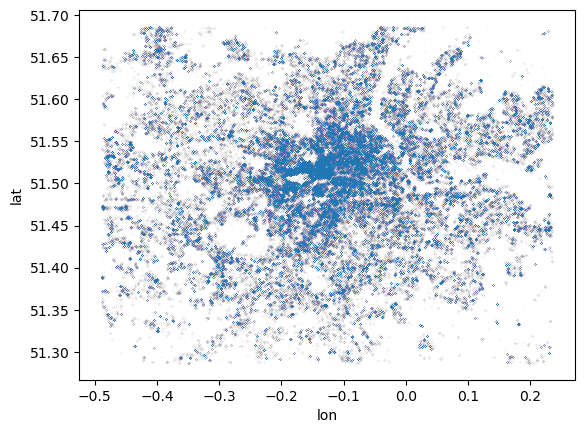

In [8]:
# London users homeloc
user_lon_s10.plot.scatter("lon", "lat", s=0.005, alpha=0.05)

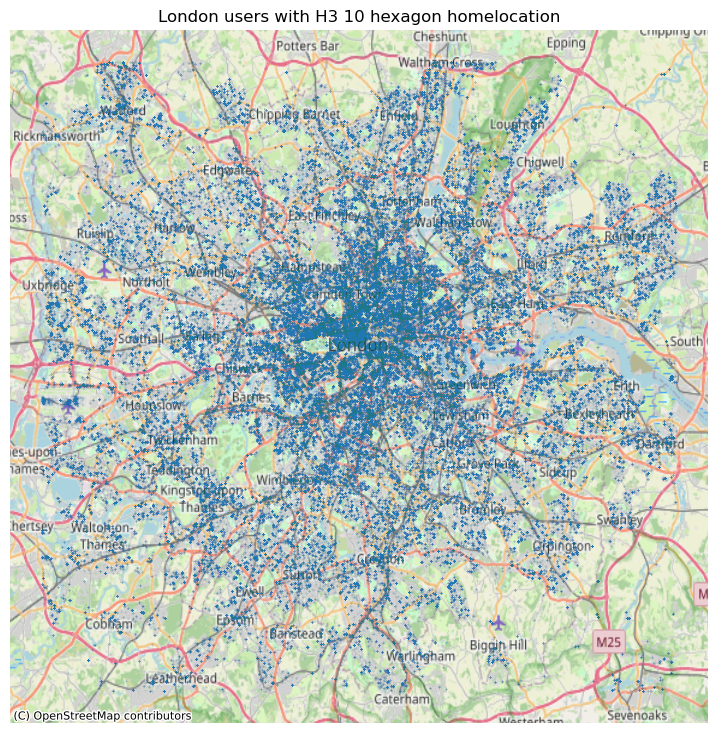

In [15]:
fig, ax = plt.subplots(figsize=(9, 9))

user_lon_s10_3857.plot.scatter(
    x="x",
    y="y",
    s=0.05,
    alpha=0.04,
    ax=ax
)

ax.set_axis_off()
ax.set_title("London users with H3 10 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

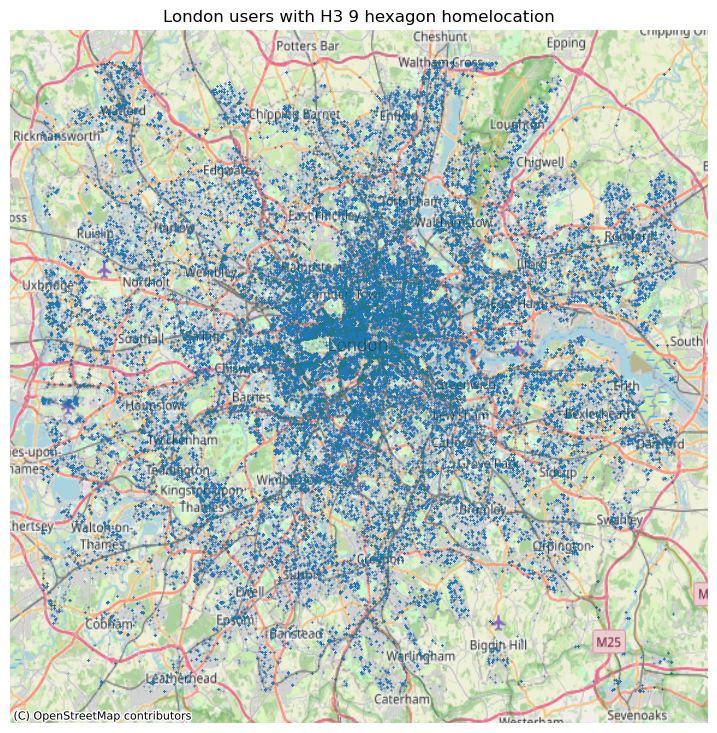

In [22]:
fig, ax = plt.subplots(figsize=(9, 9))

user_lon_s9_3857.plot.scatter(
    x="x",
    y="y",
    s=0.05,
    alpha=0.04,
    ax=ax
)

ax.set_axis_off()
ax.set_title("London users with H3 9 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

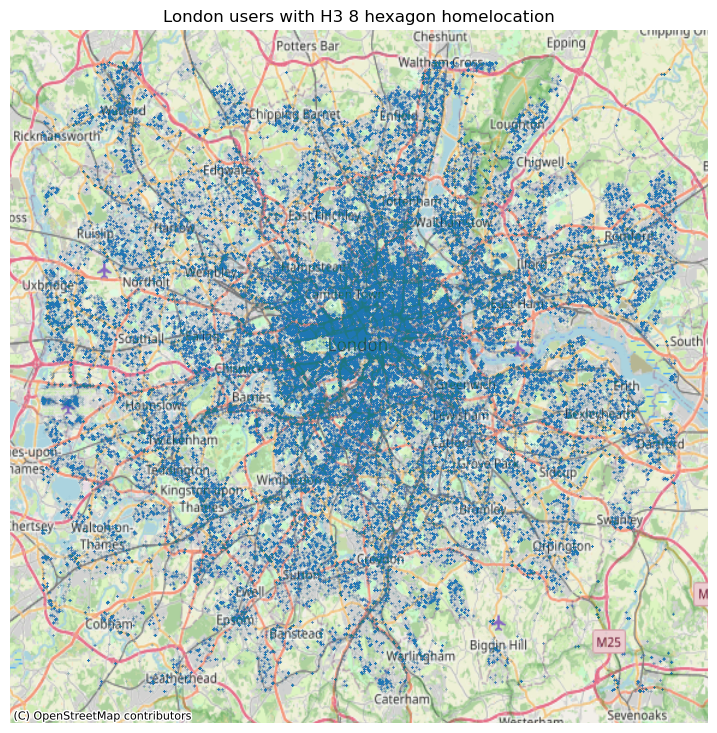

In [ ]:
fig, ax = plt.subplots(figsize=(9, 9))

user_lon_s8_3857.plot.scatter(
    x="x",
    y="y",
    s=0.05,
    alpha=0.04,
    ax=ax
)

ax.set_axis_off()
ax.set_title("London users with H3 8 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

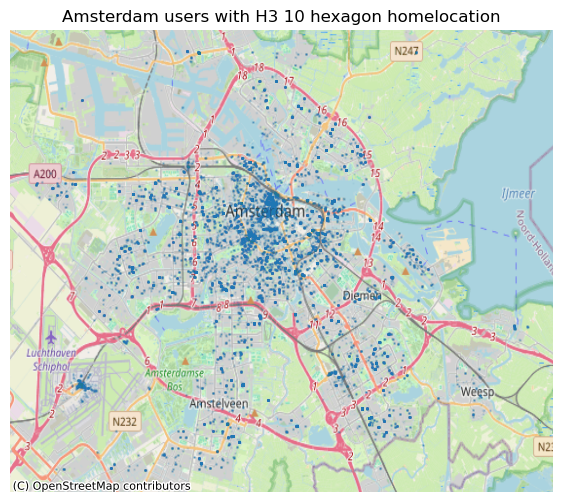

In [7]:
fig, ax = plt.subplots(figsize=(7, 6))

user_ams_s10_3857.plot.scatter(
    x="x",
    y="y",
    s=0.5,
    alpha=0.04,
    ax=ax
)

ax.set_axis_off()
ax.set_title("Amsterdam users with H3 10 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

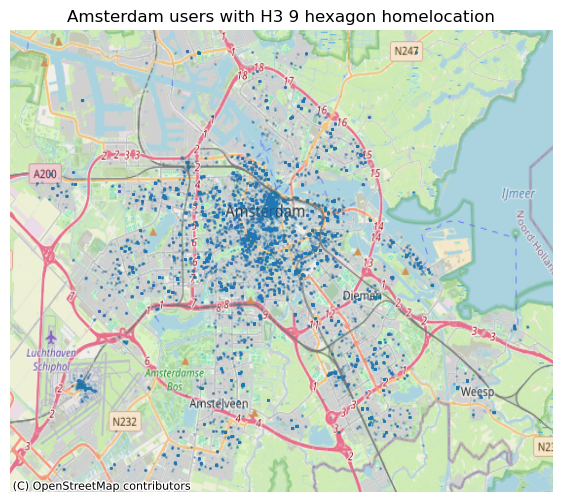

In [6]:
fig, ax = plt.subplots(figsize=(7, 6))

user_ams_s9_3857.plot.scatter(
    x="x",
    y="y",
    s=0.5,
    alpha=0.04,
    ax=ax
)

ax.set_axis_off()
ax.set_title("Amsterdam users with H3 9 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

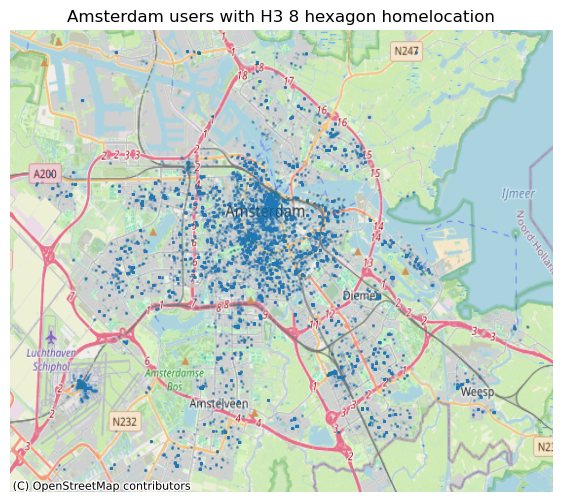

In [8]:
fig, ax = plt.subplots(figsize=(7, 6))

user_ams_s8_3857.plot.scatter(
    x="x",
    y="y",
    s=0.5,
    alpha=0.04,
    ax=ax
)

ax.set_axis_off()
ax.set_title("Amsterdam users with H3 8 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

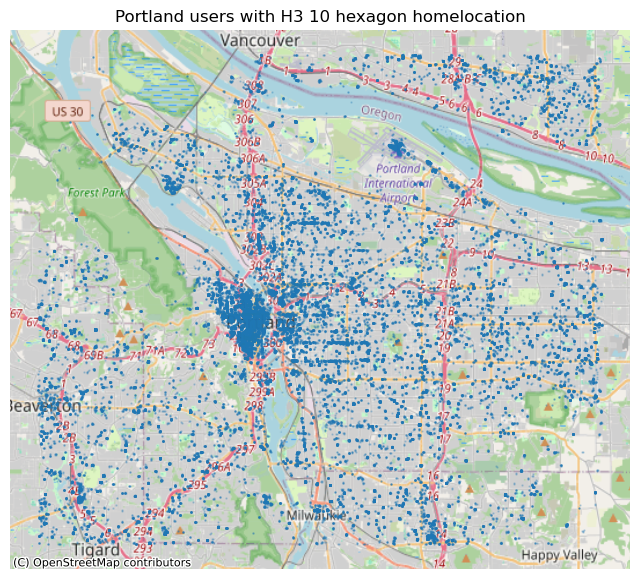

In [9]:
fig, ax = plt.subplots(figsize=(8, 7))

user_por_s10_3857.plot.scatter(
    x="x",
    y="y",
    s=0.5,
    alpha=0.25,
    ax=ax
)

ax.set_axis_off()
ax.set_title("Portland users with H3 10 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

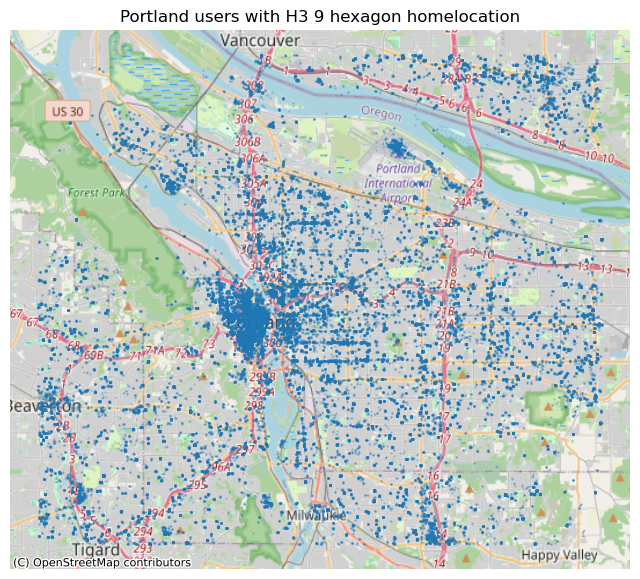

In [10]:
fig, ax = plt.subplots(figsize=(8, 7))

user_por_s9_3857.plot.scatter(
    x="x",
    y="y",
    s=0.5,
    alpha=0.25,
    ax=ax
)

ax.set_axis_off()
ax.set_title("Portland users with H3 9 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

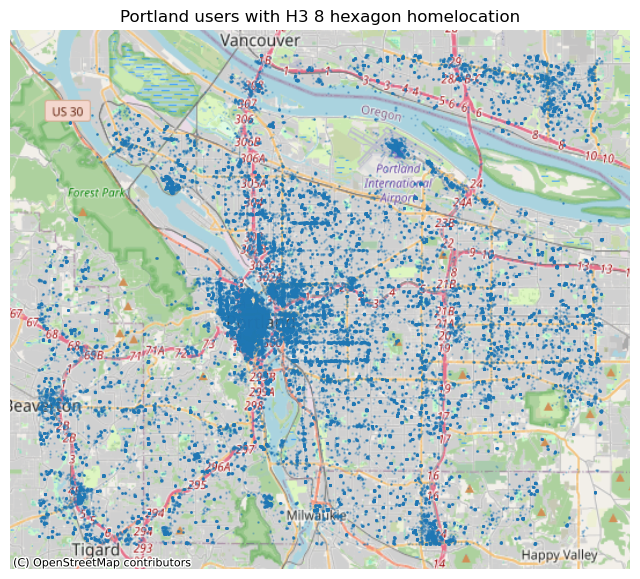

In [11]:
fig, ax = plt.subplots(figsize=(8, 7))

user_por_s8_3857.plot.scatter(
    x="x",
    y="y",
    s=0.5,
    alpha=0.25,
    ax=ax
)

ax.set_axis_off()
ax.set_title("Portland users with H3 8 hexagon homelocation")

ctx.add_basemap(
    ax,
    source=ctx.providers.OpenStreetMap.Mapnik
)

In [2]:
# create dataframes for tweets
tw_lon = pd.read_sql("""select * from homelocation_zi where city_bbox = 'london'""", engine)
tw_ams = pd.read_sql("""select * from homelocation_zi where city_bbox = 'amsterdam'""", engine)
tw_por = pd.read_sql("""select * from homelocation_zi where city_bbox = 'portland'""", engine)

# create geodataframes out of dataframes for a spatial join
tw_lon_gdf = gpd.GeoDataFrame(
    tw_lon,
    geometry=gpd.points_from_xy(tw_lon["lon"], tw_lon["lat"]),
    crs="EPSG:4326"
)

tw_ams_gdf = gpd.GeoDataFrame(
    tw_ams,
    geometry=gpd.points_from_xy(tw_ams["lon"], tw_ams["lat"]),
    crs="EPSG:4326"
)

tw_por_gdf = gpd.GeoDataFrame(
    tw_por,
    geometry=gpd.points_from_xy(tw_por["lon"], tw_por["lat"]),
    crs="EPSG:4326"
)

tw_lon_gdf = gpd.GeoDataFrame(
    tw_lon.copy(),
    geometry=gpd.points_from_xy(tw_lon["lon"], tw_lon["lat"]),
    crs="EPSG:4326"
)

tw_lon_3857 = tw_lon_gdf.to_crs(epsg=3857)
tw_lon_3857["x"] = tw_lon_3857.geometry.x
tw_lon_3857["y"] = tw_lon_3857.geometry.y

tw_ams_gdf = gpd.GeoDataFrame(
    tw_ams.copy(),
    geometry=gpd.points_from_xy(tw_ams["lon"], tw_ams["lat"]),
    crs="EPSG:4326"
)

tw_ams_3857 = tw_ams_gdf.to_crs(epsg=3857)
tw_ams_3857["x"] = tw_ams_3857.geometry.x
tw_ams_3857["y"] = tw_ams_3857.geometry.y

tw_por_gdf = gpd.GeoDataFrame(
    tw_por.copy(),
    geometry=gpd.points_from_xy(tw_por["lon"], tw_por["lat"]),
    crs="EPSG:4326"
)

tw_por_3857 = tw_por_gdf.to_crs(epsg=3857)
tw_por_3857["x"] = tw_por_3857.geometry.x
tw_por_3857["y"] = tw_por_3857.geometry.y

<Axes: xlabel='lon', ylabel='lat'>

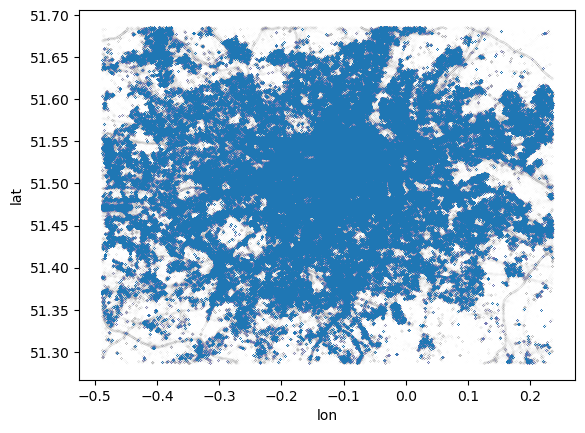

In [ ]:
# London tweets
tw_lon.plot.scatter("lon", "lat", s=0.005, alpha=0.05)

<Axes: xlabel='lon', ylabel='lat'>

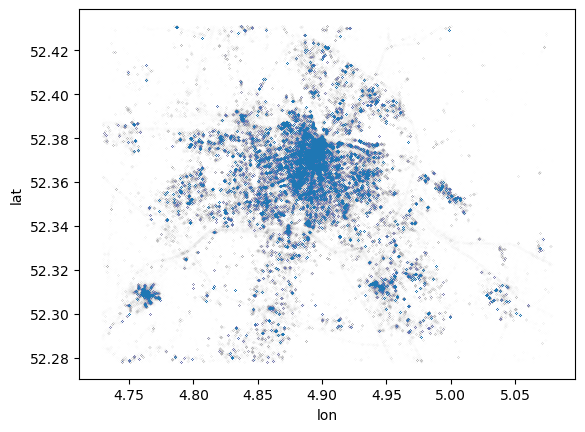

In [ ]:
# Amterdam tweets
tw_ams.plot.scatter("lon", "lat", s=0.005, alpha=0.05)

<Axes: xlabel='lon', ylabel='lat'>

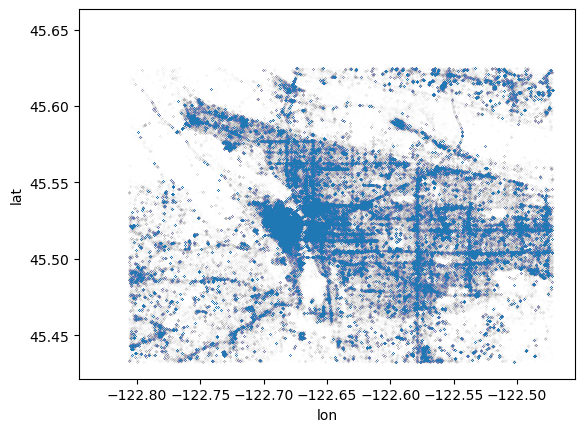

In [6]:
# Portland
tw_por.plot.scatter("lon", "lat", s=0.005, alpha=0.05)

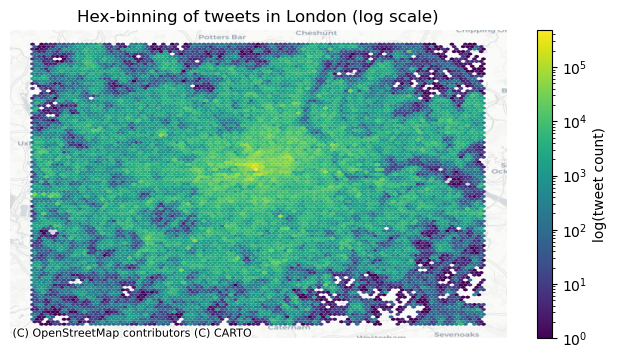

In [8]:
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(figsize=(8, 4))

hb = ax.hexbin(
    tw_lon_3857["x"],
    tw_lon_3857["y"],
    gridsize=100,
    norm=LogNorm(),        # log skála
    cmap="viridis",        # szebb színezés
    edgecolor="none"
)

cb = plt.colorbar(hb, ax=ax)
cb.set_label("log(tweet count)")

ax.set_axis_off()
ax.set_title("Hex-binning of tweets in London (log scale)")

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

plt.show()

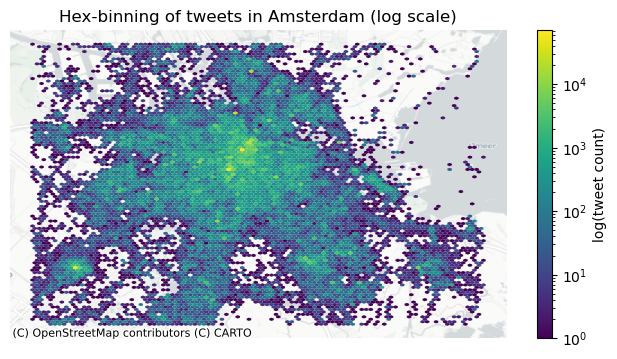

In [9]:
fig, ax = plt.subplots(figsize=(8, 4))

hb = ax.hexbin(
    tw_ams_3857["x"],
    tw_ams_3857["y"],
    gridsize=100,
    norm=LogNorm(),
    cmap="viridis",
    edgecolor="none"
)

cb = plt.colorbar(hb, ax=ax)
cb.set_label("log(tweet count)")

ax.set_axis_off()
ax.set_title("Hex-binning of tweets in Amsterdam (log scale)")

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

plt.show()

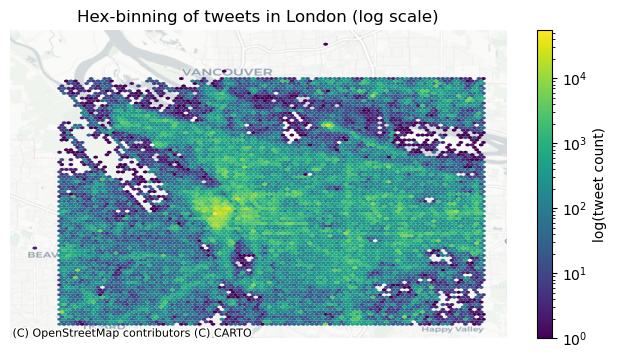

In [10]:
fig, ax = plt.subplots(figsize=(8, 4))

hb = ax.hexbin(
    tw_por_3857["x"],
    tw_por_3857["y"],
    gridsize=100,
    norm=LogNorm(),        # log skála
    cmap="viridis",        # szebb színezés
    edgecolor="none"
)

cb = plt.colorbar(hb, ax=ax)
cb.set_label("log(tweet count)")

ax.set_axis_off()
ax.set_title("Hex-binning of tweets in London (log scale)")

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

plt.show()